# PHYS 308 - Project 1 - Planet Earth's Global Temperature - With Solutions


In this project we will download temperature data from NASA’s Goddard Institute for Space Studies (**GISS**) and analyze it using **pandas** and **seaborn**. You can form groups of 2-3 people for this project. Work together on reading in and cleaning the data. Once you have a notebook containing the cleaned dataframe you can work together or split up making each of the required plots.  

### Introduction

First, we must understand the data collection method. This method was original documented by Hansen and Lebedeff in [1987](https://pubs.giss.nasa.gov/docs/1987/1987_Hansen_ha00700d.pdf) and the study has been repeated many times including in [2010](https://pubs.giss.nasa.gov/docs/2010/2010_Hansen_ha00510u.pdf). A summary of the data collection method is as follows:
1. Thousands of meteorological stations around the world (land and sea) measure the surface temperature. All measurements discussed here will be in Celsius.
1. The world average temperature throughout every month for all stations is calculated. Systematic affects are corrected and uncertainty is estimated.
1. The world average temperature every month for all meteorological stations during the three decade period 1951-1980 is defined to be the "reference monthly average temperature"
1. The **tempeature anomaly** is defined:
   * "tempeature anomaly" = "world monthly average temperature" - "reference monthly average temperature"

### Accessing the data

The GISS data can be found here: https://data.giss.nasa.gov/gistemp/

From this link please find and download the CSV file
"Global-mean monthly, seasonal, and annual means, 1880-present, updated through most recent month". The file name is GLB.Ts+dSST.csv.

Use panda's `read_csv()` with the option `skiprows=1` to read in the data and setup a dataframe.

### Data analysis Instructions

1. Data inspection - Take a look at the dataframe you have created using `df.tail()` where df is the name I have given to my dataframe.
    * You should see a "Year" column and a column for every month ("Jan", "Feb", etc.).
        * There are also columns for averages:
            * "J-D" = 1 year average temperature (January -> December)
            * "D-N" = 1 year average temperature (December -> November)
            * "DJF" = 3 month average temperature (Dec, Jan, Feb)
            * "MAM" = 3 month average temperature (Mar, Apr, May)
            * "JJA" = 3 month average temperature (Jun, Jul, Aug)
            * "SON" = 3 month average temperature (Sep, Oct, Nov)<br><br>
            
2. Setup - Set the "Year" column as the dataframe index<br><br>

3. Data cleaning - Note that the 2019 data is very recent (up to August 2019) and there is data missing for September->December. The missing data appears as three stars ("`***`"). We need to clean this up by replacing the stars with something that pandas understands: "NaN" = Not a Number. Also we should make sure that all datapoints are floats and not strings. We can accomplish this using the following lines (where df is the name I have given to the dataframe):
~~~~
df = df.replace("***", "NaN")
df = df.astype(float)
~~~~
<br><br>

4. Make a new dataframe "df_drop" containing only the month data (dropping the averages 'J-D','D-N','DJF','MAM','JJA', and 'SON' using the pandas function `drop()`).<br><br>

5. Make plots using your dataframe df_drop<br><br>
    1. Make a plot of the January Temperature Anomaly (column "Jan"). The plot should contain the temperature anomaly in degrees celsius on the y-axis and the year on the x-axis. Basically you are plotting the data contained in one column of the dataframe vs the index of the dataframe (the year). Please label your axes and include temperature units. Note, you can make bigger plots and label the axes using the following syntax (example from a previous notebook):
~~~
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
df_pop3.loc["United Kingdom"].NumericPopulation.plot(ax=ax,kind='bar')
ax.set_ylabel("Population")
~~~
<br><br>
    1. Repeat the same plot but with option `kind='bar'`<br><br>
    1. Make a new column in your new dataframe with column name "Yearly Avg" containing the 12-month average temperature for the year and plot this column ("Yearly Average Temperature Anomaly" vs "Year"). Calculate this average on your own (instead of relying on the "J-D" column which we just dropped). To do this you can use the pandas [mean()](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.mean.html) function . My recommendation: Read the documentation linked above so that you can choose the option of taking the mean of a dataframe row instead of a column (option="axis").<br><br>
    1. Again plot "Temperature Anomaly" Vs "Year", this time as a line graph. Plot the temperature anomaly for all 12 months and for the yearly average. You should have a total of 13 lines drawn. Draw the yearly average line with a larger line width and with color black in order to make it stand out. Please label your axes and draw a legend.<br><br>
    1. This time we want to plot "Temperature Anomaly" Vs "Month". We will do this for every every year (so there will be hundreds of lines drawn). The easiest way to do this is to use the transpose() function to convert the dataframe indices to columns and the columns to indices. I also recommend setting the color palette using plot() option `cmap="BuPu"`. This will ensure that one can tell the old years from the more recent years. You may also want to draw the legend off to the side of the plot using the following syntax
~~~
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
~~~
    <br><br>
    1. Use seaborn to plot the dataframe as a heatmap. The y-axis should be the month and the x-axis should be the year. The z-axis (the color of the heatmap) should represent the temperature anomaly. Again the easiest way to make the y-axis the month is to use the transpose() function on the dataframe. Choose a different color palette which you think will be a good way of representating the data https://matplotlib.org/examples/color/colormaps_reference.html<br><br>
    
    
    
    
### Code:

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#  sometimes necessary for plotting with Jupyter+pandas+pyplot
%matplotlib inline

from matplotlib import pyplot
pyplot.rcParams['figure.dpi'] = 600

In [70]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Part 1 - Data Inspection

In [71]:
# Data from https://data.giss.nasa.gov/gistemp/
df = pd.read_csv("https://data.giss.nasa.gov/gistemp/tabledata_v4/GLB.Ts+dSST.csv",skiprows=1)

In [72]:
df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
0,1880,-0.19,-0.24,-0.09,-0.16,-0.10,-0.21,-0.17,-0.10,-0.14,-0.23,-0.21,-.18,-.17,***,***,-0.12,-0.16,-0.19
1,1881,-0.19,-0.14,0.03,0.05,0.07,-0.19,0.00,-0.04,-0.15,-0.22,-0.19,-.07,-.09,-.09,-.17,0.05,-0.07,-0.19
2,1882,0.16,0.14,0.05,-0.17,-0.14,-0.23,-0.16,-0.07,-0.14,-0.23,-0.16,-.36,-.11,-.08,.08,-0.09,-0.15,-0.18
3,1883,-0.29,-0.37,-0.12,-0.18,-0.18,-0.07,-0.07,-0.14,-0.22,-0.11,-0.24,-.11,-.18,-.20,-.34,-0.16,-0.09,-0.19
4,1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-0.27,-0.25,-0.33,-.31,-.28,-.27,-.11,-0.37,-0.31,-0.28


## Part 2 - Setup

In [73]:
df = df.set_index("Year")
df.tail()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
Year,,,,,,,,,,,,,,,,,,
2019,0.93,0.95,1.17,1.02,0.85,0.90,0.95,0.95,0.93,1.00,0.99,1.09,.98,.96,.93,1.01,0.93,0.97
2020,1.17,1.24,1.17,1.13,1.01,0.91,0.90,0.87,0.98,0.88,1.10,.81,1.02,1.04,1.17,1.10,0.89,0.99
2021,0.81,0.64,0.89,0.76,0.78,0.84,0.92,0.82,0.92,1.00,0.94,.86,.85,.84,.75,0.81,0.86,0.95
2022,0.91,0.89,1.05,0.83,0.84,0.92,0.94,0.95,0.89,0.96,0.72,.80,.89,.90,.89,0.91,0.94,0.86
2023,0.87,0.97,1.20,1.00,0.93,1.08,1.18,1.19,1.47,1.34,1.44,***,***,1.12,.88,1.05,1.15,1.42


## Part 3 - Data Cleaning

In [74]:
df = df.replace("***", "NaN")
df = df.astype(float)

In [75]:
s2018 = df.loc[[2017,2018]]

In [76]:
s2018.head()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,J-D,D-N,DJF,MAM,JJA,SON
Year,,,,,,,,,,,,,,,,,,
2017,1.03,1.14,1.17,0.94,0.92,0.72,0.82,0.87,0.77,0.90,0.88,0.93,0.92,0.92,1.01,1.01,0.80,0.85
2018,0.82,0.85,0.89,0.89,0.82,0.77,0.83,0.77,0.80,1.02,0.82,0.91,0.85,0.85,0.87,0.87,0.79,0.88


In [77]:
s2018["Avg"]=s2018.mean(axis=1)
s2018["Avg"]

Year
2017    0.922222
2018    0.850000
Name: Avg, dtype: float64

## Part 4 - Drop columns

In [78]:
df_drop = df.drop(['J-D','D-N','DJF','MAM','JJA','SON'], axis=1)
df_drop.head()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
Year,,,,,,,,,,,,
1880,-0.19,-0.24,-0.09,-0.16,-0.10,-0.21,-0.17,-0.10,-0.14,-0.23,-0.21,-0.18
1881,-0.19,-0.14,0.03,0.05,0.07,-0.19,0.00,-0.04,-0.15,-0.22,-0.19,-0.07
1882,0.16,0.14,0.05,-0.17,-0.14,-0.23,-0.16,-0.07,-0.14,-0.23,-0.16,-0.36
1883,-0.29,-0.37,-0.12,-0.18,-0.18,-0.07,-0.07,-0.14,-0.22,-0.11,-0.24,-0.11
1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-0.27,-0.25,-0.33,-0.31


## Part 5 - Plots




### 5.1
Make a plot of the January Temperature Anomaly (column "Jan"). The plot should contain the temperature anomaly in degrees celsius on the y-axis and the year on the x-axis. Basically you are plotting the data contained in one column of the dataframe vs the index of the dataframe (the year). Please label your axes and include temperature units. Note, you can make bigger plots and label the axes using the following syntax (example from a previous notebook):

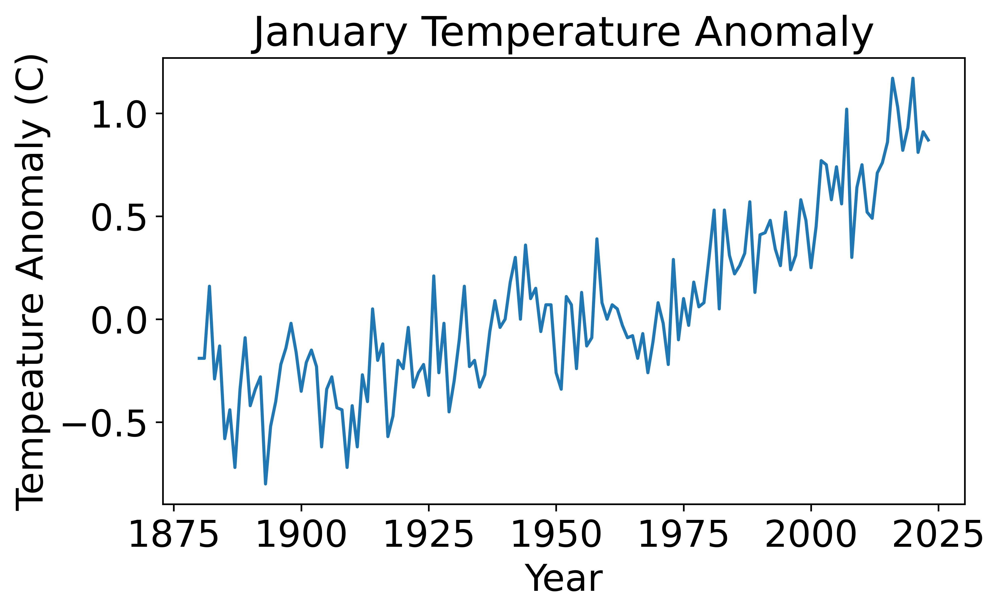

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
df_drop["Jan"].plot(ax=ax)
ax.set_title('January Temperature Anomaly', fontsize=20)
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

### 5.2
Repeat the same plot but with option kind='bar'

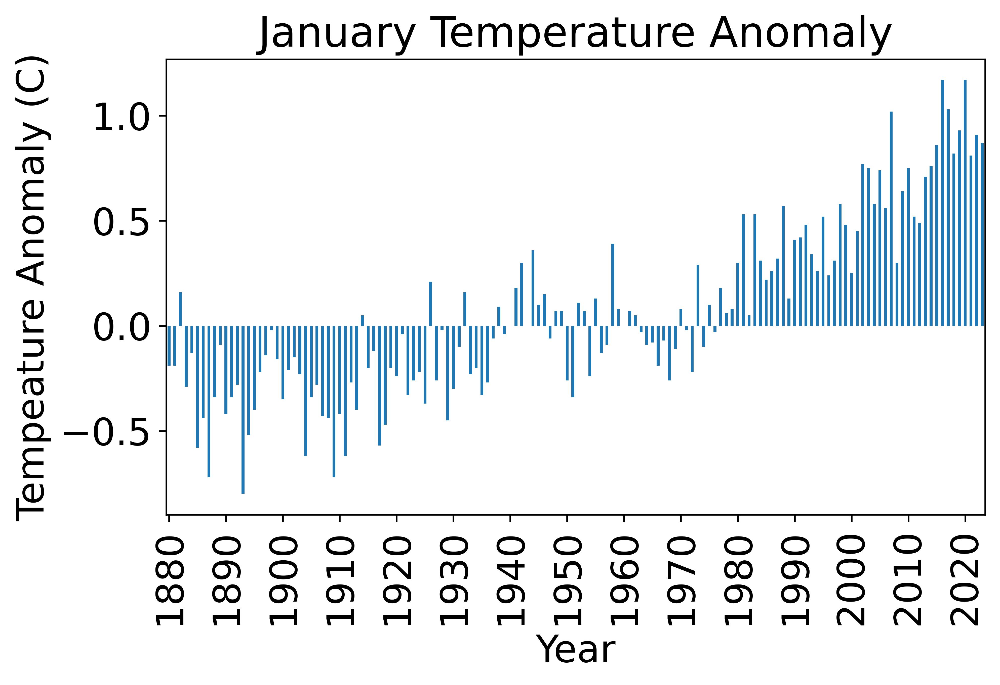

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
df_drop["Jan"].plot(ax=ax, kind="bar")
ax.set_title('January Temperature Anomaly', fontsize=20)
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
ax.xaxis.set_major_locator(MultipleLocator(10))
ax.tick_params(axis='both', which='major', labelsize=18)

### 5.3

Make a new column in your dataframe with column name "Yearly Avg" containing the 12-month average temperature for the year and plot this column ("Yearly Average Temperature Anomaly" vs "Year"). To do this you can use the pandas mean() function . My recommendation: Read the documentation linked above so that you can choose the option of taking the mean of a dataframe row instead of a column (option="axis").


In [81]:
df_drop["Yearly Avg"]=df_drop.mean(axis=1)
df_drop.head()

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Yearly Avg
Year,,,,,,,,,,,,,
1880,-0.19,-0.24,-0.09,-0.16,-0.10,-0.21,-0.17,-0.10,-0.14,-0.23,-0.21,-0.18,-0.168333
1881,-0.19,-0.14,0.03,0.05,0.07,-0.19,0.00,-0.04,-0.15,-0.22,-0.19,-0.07,-0.086667
1882,0.16,0.14,0.05,-0.17,-0.14,-0.23,-0.16,-0.07,-0.14,-0.23,-0.16,-0.36,-0.109167
1883,-0.29,-0.37,-0.12,-0.18,-0.18,-0.07,-0.07,-0.14,-0.22,-0.11,-0.24,-0.11,-0.175000
1884,-0.13,-0.08,-0.36,-0.40,-0.34,-0.35,-0.31,-0.28,-0.27,-0.25,-0.33,-0.31,-0.284167


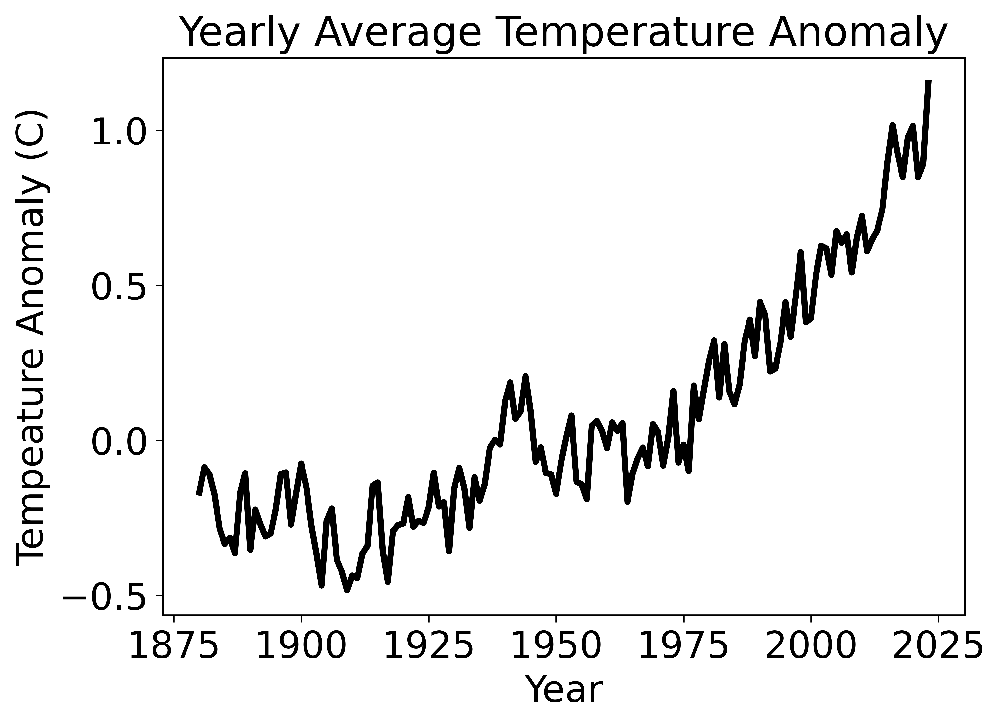

In [82]:
fig, ax = plt.subplots(1, 1, figsize=(7, 5))
df_drop["Yearly Avg"].plot(ax=ax,kind='line',color='k',linewidth=3)
ax.set_title('Yearly Average Temperature Anomaly', fontsize=20)
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

### 5.4
Again plot "Temperature Anomaly" Vs "Year", this time as a line graph. Plot the temperature anomaly for all 12 months and for the yearly average. You should have a total of 13 lines drawn. Draw the yearly average line with a larger line width and with color black in order to make it stand out. Please label your axes and draw a legend.

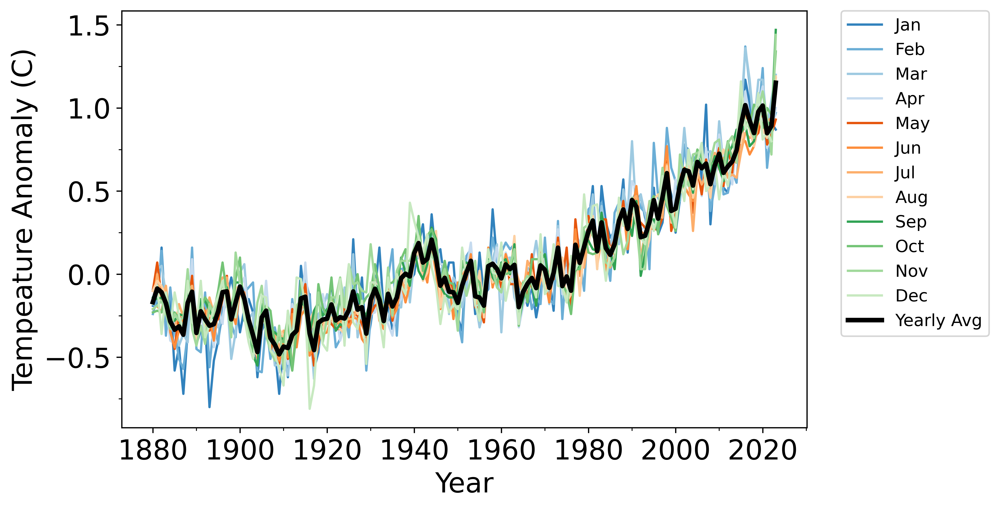

In [83]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5))

# Set Color cycle
#   https://matplotlib.org/stable/users/explain/colors/colormaps.html
#  plot_color_gradients('Qualitative',
#                     ['Pastel1', 'Pastel2', 'Paired', 'Accent', 'Dark2',
#                      'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b',
#                      'tab20c'])
from matplotlib.cm import get_cmap
name = "tab20c"
cmap = get_cmap(name)  # type: matplotlib.colors.ListedColormap
colors = cmap.colors   # type: list
ax.set_prop_cycle(color=colors)

# Plot all columns except the Yearly Average (since we want to plot
#  Yearly Average with a different line size and
#  we don't want it to appear in the legend twice)
df_drop.loc[:, df_drop.columns != 'Yearly Avg'].plot(ax=ax)

# Plot the yearly averge with large line width
df_drop["Yearly Avg"].plot(ax=ax,color='k',linewidth=3)

# Plot beautification
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., prop={'size': 11})
ax.set_ylabel("Temperature Anomaly (C)")
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
ax.xaxis.set_minor_locator(MultipleLocator(10))
ax.yaxis.set_minor_locator(MultipleLocator(0.25))

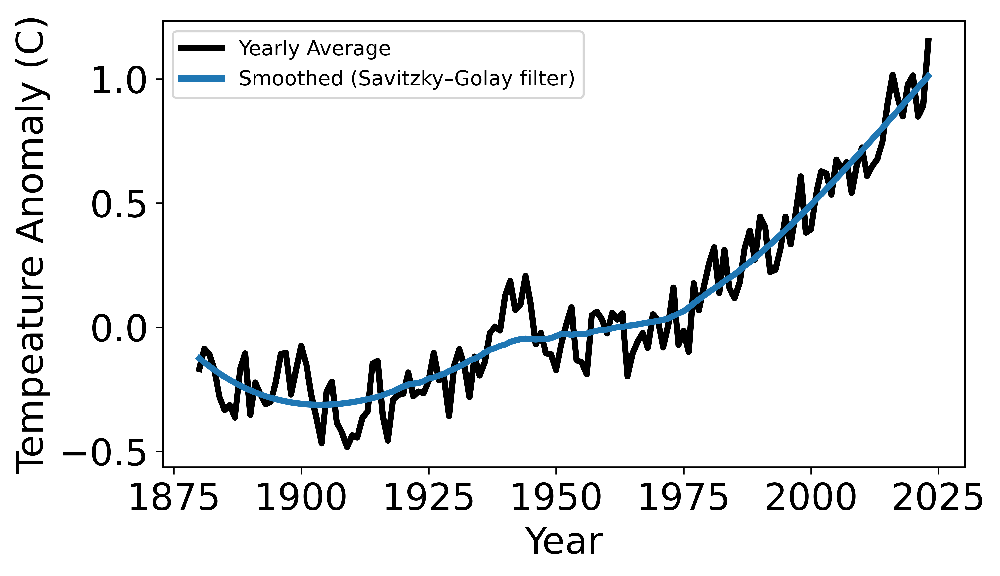

In [89]:
# Just for fun. Smooth the data.

from scipy.signal import savgol_filter
y_smooth1 = savgol_filter(df_drop["Yearly Avg"], 71, 3)  # savgol_filter(x, window_length, polyorder, deriv=0, delta=1.0, axis=-1, mode='interp', cval=0.0)[source]¶
fig, ax = plt.subplots(1, 1, figsize=(7, 4))
df_drop["Yearly Avg"].plot(ax=ax,color='k',linewidth=3,label = "Yearly Average")
ax.plot(df_drop.index.values,y_smooth1,linewidth=3,label="Smoothed (Savitzky–Golay filter)")
#df_drop.plot(df_drop.index.values,y_smooth1,linewidth=3,label="Smoothed Yearly Average (Savitzky-Golay)")
plt.legend()
ax.set_ylabel("Temperature Anomaly (C)")
ax.set_xlabel("Year",fontsize=18)
ax.set_ylabel("Tempeature Anomaly (C)",fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)



### 5.5

This time we want to plot "Temperature Anomaly" Vs "Month". We will do this for every every year (so there will be hundreds of lines drawn). The easiest way to do this is to use the transpose() function to convert the dataframe indices to columns and the columns to indices. I also recommend setting the color palette using plot() option cmap="BuPu". This will ensure that one can tell the old years from the more recent years. You may also want to draw the legend off to the side of the plot using the following syntax

In [90]:
df_drop.transpose().tail()

Year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Sep,-0.140000,-0.150000,-0.140000,-0.220,-0.270000,-0.280000,-0.240000,-0.250000,-0.1200,-0.240000,...,0.870000,0.8500,0.900000,0.770000,0.800000,0.9300,0.980000,0.920000,0.890000,1.470000
Oct,-0.230000,-0.220000,-0.230000,-0.110,-0.250000,-0.230000,-0.270000,-0.350000,0.0200,-0.250000,...,0.800000,1.0900,0.890000,0.900000,1.020000,1.0000,0.880000,1.000000,0.960000,1.340000
Nov,-0.210000,-0.190000,-0.160000,-0.240,-0.330000,-0.240000,-0.280000,-0.260000,0.0300,-0.330000,...,0.670000,1.0600,0.920000,0.880000,0.820000,0.9900,1.100000,0.940000,0.720000,1.440000
Dec,-0.180000,-0.070000,-0.360000,-0.110,-0.310000,-0.110000,-0.250000,-0.330000,-0.0400,-0.290000,...,0.780000,1.1600,0.870000,0.930000,0.910000,1.0900,0.810000,0.860000,0.800000,NaN
Yearly Avg,-0.168333,-0.086667,-0.109167,-0.175,-0.284167,-0.334167,-0.314167,-0.364167,-0.1725,-0.105833,...,0.745833,0.8975,1.016667,0.924167,0.849167,0.9775,1.014167,0.848333,0.891667,1.151818


In [115]:
# Plot "Temperature Anomaly vs Month", with a line for every year
#  There will be hundreds of lines

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
#plt.style.use('seaborn-light_palette')

# Drop Yearly Average so we only have month data in our plot
df_drop3 = df.drop(['J-D','D-N','DJF','MAM','JJA','SON'], axis=1)

#print(df_drop3.tail())

df_t = df_drop3.transpose()
print(df_t.tail())

df_t.plot(ax=ax,cmap="brg")#"BuPu")
#df_t.iloc[:-2,].plot(ax=ax,cmap="brg")
df_t.loc[:, df_t.columns != 2023].plot(ax=ax,cmap="brg")
df_t[2023].plot(ax=ax,color="magenta",linewidth=3)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,  ncol=5, frameon=False,fontsize=10)
ax.set_ylabel("Temperature Anomaly (C)",fontsize=18)
ax.set_xlabel("Month",fontsize=18)

ax.set_title('Temperature Anomaly for Each Month', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=18)

Year  1880  1881  1882  1883  1884  1885  1886  1887  1888  1889  ...  2014  \
Aug  -0.10 -0.04 -0.07 -0.14 -0.28 -0.31 -0.31 -0.36 -0.16 -0.20  ...  0.83   
Sep  -0.14 -0.15 -0.14 -0.22 -0.27 -0.28 -0.24 -0.25 -0.12 -0.24  ...  0.87   
Oct  -0.23 -0.22 -0.23 -0.11 -0.25 -0.23 -0.27 -0.35  0.02 -0.25  ...  0.80   
Nov  -0.21 -0.19 -0.16 -0.24 -0.33 -0.24 -0.28 -0.26  0.03 -0.33  ...  0.67   
Dec  -0.18 -0.07 -0.36 -0.11 -0.31 -0.11 -0.25 -0.33 -0.04 -0.29  ...  0.78   

Year  2015  2016  2017  2018  2019  2020  2021  2022  2023  
Aug   0.79  1.02  0.87  0.77  0.95  0.87  0.82  0.95  1.19  
Sep   0.85  0.90  0.77  0.80  0.93  0.98  0.92  0.89  1.47  
Oct   1.09  0.89  0.90  1.02  1.00  0.88  1.00  0.96  1.34  
Nov   1.06  0.92  0.88  0.82  0.99  1.10  0.94  0.72  1.44  
Dec   1.16  0.87  0.93  0.91  1.09  0.81  0.86  0.80   NaN  

[5 rows x 144 columns]


In [ ]:
lines = ax.get_lines()
print(lines)

<a list of 145 Line2D objects>


In [ ]:
df_drop3.axes

[Int64Index([1880, 1881, 1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889,
             ...
             2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023],
            dtype='int64', name='Year', length=144),
 Index(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct',
        'Nov', 'Dec'],
       dtype='object')]

In [ ]:
df_t.axes

[Index(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct',
        'Nov', 'Dec'],
       dtype='object'),
 Int64Index([1880, 1881, 1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889,
             ...
             2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023],
            dtype='int64', name='Year', length=144)]

In [ ]:
df_t.index

Index(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct',
       'Nov', 'Dec'],
      dtype='object')

In [ ]:
df_t.columns

Int64Index([1880, 1881, 1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889,
            ...
            2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023],
           dtype='int64', name='Year', length=144)

In [117]:
df_t[2023]

Jan    0.87
Feb    0.97
Mar    1.20
Apr    1.00
May    0.93
Jun    1.08
Jul    1.18
Aug    1.19
Sep    1.47
Oct    1.34
Nov    1.44
Dec     NaN
Name: 2023, dtype: float64

In [118]:
df_t.iloc[:,0:5]

Year,1880,1881,1882,1883,1884
Jan,-0.19,-0.19,0.16,-0.29,-0.13
Feb,-0.24,-0.14,0.14,-0.37,-0.08
Mar,-0.09,0.03,0.05,-0.12,-0.36
Apr,-0.16,0.05,-0.17,-0.18,-0.40
May,-0.10,0.07,-0.14,-0.18,-0.34
Jun,-0.21,-0.19,-0.23,-0.07,-0.35
Jul,-0.17,0.00,-0.16,-0.07,-0.31
Aug,-0.10,-0.04,-0.07,-0.14,-0.28
Sep,-0.14,-0.15,-0.14,-0.22,-0.27
Oct,-0.23,-0.22,-0.23,-0.11,-0.25


In [ ]:
df_t.iloc[:,0:10].mean(axis=1) # axis 0 = index, axis 1 = columns

Jan   -0.281
Feb   -0.231
Mar   -0.190
Apr   -0.202
May   -0.192
Jun   -0.235
Jul   -0.166
Aug   -0.197
Sep   -0.205
Oct   -0.212
Nov   -0.221
Dec   -0.205
dtype: float64

In [119]:
# Just for fun: A decadal average plot

df_10 = pd.DataFrame()

for year in range (1880,2023,10):

  index = int(year-1880)

  if year!=2020:
    name = str(year)+"-"+str(year+9)+" average"
    df_10[name]=df_t.iloc[:,index:index+10].mean(axis=1)
    print(name,index,index+10)
  else:
    name = str(year)+"-"+str(year+3)+" average"
    df_10[name]=df_t.iloc[:,index:index+3].mean(axis=1)
    print(name,index,index+3)


#df_10["1880-1889 average"]=df_t.iloc[:,0:10].mean(axis=1)

1880-1889 average 0 10
1890-1899 average 10 20
1900-1909 average 20 30
1910-1919 average 30 40
1920-1929 average 40 50
1930-1939 average 50 60
1940-1949 average 60 70
1950-1959 average 70 80
1960-1969 average 80 90
1970-1979 average 90 100
1980-1989 average 100 110
1990-1999 average 110 120
2000-2009 average 120 130
2010-2019 average 130 140
2020-2023 average 140 143


In [120]:
df_10

,1880-1889 average,1890-1899 average,1900-1909 average,1910-1919 average,1920-1929 average,1930-1939 average,1940-1949 average,1950-1959 average,1960-1969 average,1970-1979 average,1980-1989 average,1990-1999 average,2000-2009 average,2010-2019 average,2020-2023 average
Jan,-0.281,-0.330,-0.377,-0.322,-0.198,-0.128,0.117,-0.028,-0.071,0.042,0.322,0.404,0.606,0.804,0.963333
Feb,-0.231,-0.326,-0.303,-0.303,-0.267,-0.114,0.055,-0.066,-0.019,0.018,0.303,0.491,0.602,0.818,0.923333
Mar,-0.190,-0.300,-0.268,-0.360,-0.199,-0.154,0.037,-0.070,-0.035,0.066,0.300,0.455,0.660,0.915,1.036667
Apr,-0.202,-0.263,-0.305,-0.314,-0.282,-0.179,0.084,-0.058,-0.062,0.068,0.240,0.411,0.586,0.826,0.906667
May,-0.192,-0.237,-0.337,-0.334,-0.285,-0.159,0.053,-0.053,-0.041,0.048,0.265,0.348,0.550,0.788,0.876667
Jun,-0.235,-0.225,-0.319,-0.367,-0.313,-0.180,-0.012,-0.039,-0.009,0.025,0.195,0.422,0.541,0.730,0.890000
Jul,-0.166,-0.171,-0.301,-0.310,-0.256,-0.126,0.026,-0.033,-0.019,0.020,0.228,0.376,0.551,0.727,0.920000
Aug,-0.197,-0.197,-0.305,-0.320,-0.264,-0.118,0.011,-0.032,-0.014,0.013,0.239,0.343,0.560,0.801,0.880000
Sep,-0.205,-0.168,-0.312,-0.308,-0.226,-0.099,0.022,-0.033,-0.030,0.032,0.229,0.299,0.593,0.781,0.930000
Oct,-0.212,-0.153,-0.278,-0.287,-0.168,-0.030,0.107,-0.036,-0.004,0.008,0.196,0.351,0.601,0.856,0.946667


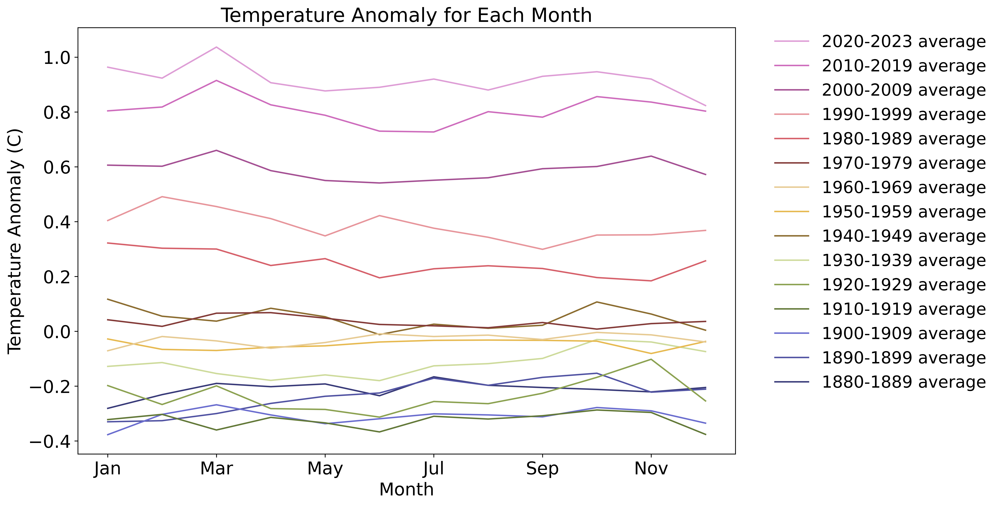

In [121]:
# Just for fun: A decadal average plot

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
#plt.style.use('seaborn-light_palette')

df_10.plot(ax=ax,cmap="tab20b")#"BuPu")#"brg")

handles, labels = ax.get_legend_handles_labels()
plt.legend(handles[::-1], labels[::-1],bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1, frameon=False, fontsize=17)
ax.set_ylabel("Temperature Anomaly (C)",fontsize=18)
ax.set_xlabel("Month",fontsize=18)

ax.set_title('Temperature Anomaly for Each Month', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=18)

#from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
#ax.xaxis.set_minor_locator(MultipleLocator(12))
#ax.yaxis.set_minor_locator(MultipleLocator(0.25))

#for axi in ax.flat:
#    axi.xaxis.set_major_locator(ax.MaxNLocator(12))

### 5.6

Use seaborn to plot the dataframe as a heatmap. The y-axis should be the month and the x-axis should be the year. The z-axis (the color of the heatmap) should represent the temperature anomaly. Again the easiest way to make the y-axis the month is to use the transpose() function on the dataframe. Choose a different color palette which you think will be a good way of representating the data https://matplotlib.org/examples/color/colormaps_reference.html

In [122]:
# Drop Yearly Average so we only have month data in our plot
df_drop2 = df.drop(['J-D','D-N','DJF','MAM','JJA','SON'], axis=1)

In [ ]:
import seaborn as sns
sns.set_style("ticks")
sns.set_context("paper")
fig, ax = plt.subplots(1, 1, figsize=(22, 10))
ax = sns.heatmap(df_drop2.T,cmap="inferno")
ax.set_ylabel("Month",fontsize=22)
ax.set_xlabel("Year",fontsize=22)
ax.set_title('Average Temperature Anomaly (C) for every month of every year since 1880', fontsize=24)
ax.tick_params(axis='x', which='major', labelsize=14)
ax.tick_params(axis='y', which='major', labelsize=16)

# Colorbar beautification
cbar = ax.collections[0].colorbar
# here set the labelsize by 20
cbar.ax.tick_params(labelsize=16)
cbar.set_label("Temperature Anomaly (C)",size=22)


In [123]:
transpose = df_drop.T
transpose.tail()

Year,1880,1881,1882,1883,1884,1885,1886,1887,1888,1889,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Sep,-0.140000,-0.150000,-0.140000,-0.220,-0.270000,-0.280000,-0.240000,-0.250000,-0.1200,-0.240000,...,0.870000,0.8500,0.900000,0.770000,0.800000,0.9300,0.980000,0.920000,0.890000,1.470000
Oct,-0.230000,-0.220000,-0.230000,-0.110,-0.250000,-0.230000,-0.270000,-0.350000,0.0200,-0.250000,...,0.800000,1.0900,0.890000,0.900000,1.020000,1.0000,0.880000,1.000000,0.960000,1.340000
Nov,-0.210000,-0.190000,-0.160000,-0.240,-0.330000,-0.240000,-0.280000,-0.260000,0.0300,-0.330000,...,0.670000,1.0600,0.920000,0.880000,0.820000,0.9900,1.100000,0.940000,0.720000,1.440000
Dec,-0.180000,-0.070000,-0.360000,-0.110,-0.310000,-0.110000,-0.250000,-0.330000,-0.0400,-0.290000,...,0.780000,1.1600,0.870000,0.930000,0.910000,1.0900,0.810000,0.860000,0.800000,NaN
Yearly Avg,-0.168333,-0.086667,-0.109167,-0.175,-0.284167,-0.334167,-0.314167,-0.364167,-0.1725,-0.105833,...,0.745833,0.8975,1.016667,0.924167,0.849167,0.9775,1.014167,0.848333,0.891667,1.151818


In [125]:
import seaborn as sns
sns.set_style("ticks")
sns.set_context("paper")
fig, ax = plt.subplots(1, 1, figsize=(10, 22))
ax = sns.heatmap(df_drop2,cmap="inferno", cbar_kws = dict(location="bottom",pad=0.05))
ax.set_ylabel("Year",fontsize=22)
ax.set_xlabel("Month",fontsize=22)
ax.set_title('Average Temperature Anomaly (C) for \n every month of every year since 1880', fontsize=24)
ax.tick_params(axis='x', which='major', labelsize=14)
ax.tick_params(axis='y', which='major', labelsize=16)

# Colorbar beautification
cbar = ax.collections[0].colorbar

# here set the labelsize by 20
cbar.ax.tick_params(labelsize=16)
cbar.set_label("Temperature Anomaly (C)",size=22)